# COURSE:   PGP [AI&ML]

## Learner :  Chaitanya Kumar Battula
## Module  : Advanced Deep Learning
## Topic   : Object_Detection_E2E_TF2

#### 1. Install TensorFlow Object Detection API
- For latest install instructions, check the [github](https://github.com/tensorflow/models/tree/master/research/object_detection) page or [readthedocs](https://tensorflow-object-detection-api-tutorial.readthedocs.io/en/latest/training.html) site for this API.

In [1]:
#Clone githun repository
!git clone https://github.com/tensorflow/models

Cloning into 'models'...
remote: Enumerating objects: 57544, done.
remote: Counting objects: 100% (1607/1607), done.
remote: Compressing objects: 100% (550/550), done.
remote: Total 57544 (delta 1105), reused 1492 (delta 1041), pack-reused 55937
Receiving objects: 100% (57544/57544), 572.94 MiB | 35.88 MiB/s, done.
Resolving deltas: 100% (39770/39770), done.


In [2]:
#Upgrade pip package
!pip install --upgrade pip

     |████████████████████████████████| 1.6MB 30.5MB/s 
  Found existing installation: pip 19.3.1
    Uninstalling pip-19.3.1:
      Successfully uninstalled pip-19.3.1


Install TensorFlow Object Detection API

In [3]:
%%bash
cd models/research
# Compile protos.
protoc object_detection/protos/*.proto --python_out=.
# Install TensorFlow Object Detection API.
cp object_detection/packages/tf2/setup.py .
python -m pip install --use-feature=2020-resolver .

Processing /content/models/research
  Created wheel for object-detection: filename=object_detection-0.1-py3-none-any.whl size=1650080 sha256=2f6f2fb00f80d4251b62000bbcf41380941dad8b7ac437506ab2fa177d5838c4
  Stored in directory: /tmp/pip-ephem-wheel-cache-dnnpcd5x/wheels/fa/a4/d2/e9a5057e414fd46c8e543d2706cd836d64e1fcd9eccceb2329
  Created wheel for avro-python3: filename=avro_python3-1.9.2.1-py3-none-any.whl size=43512 sha256=70c7d80f5839cb5cf12b6649bcb611237afa0e5559b84ce61fd7a542e9d920e8
  Stored in directory: /root/.cache/pip/wheels/bc/49/5f/fdb5b9d85055c478213e0158ac122b596816149a02d82e0ab1
  Created wheel for dill: filename=dill-0.3.1.1-py3-none-any.whl size=78532 sha256=2a2de9e71661a9ba6edf83f95df8eb971394a29f808f3c5fcf0c37293a4ca8ee
  Stored in directory: /root/.cache/pip/wheels/a4/61/fd/c57e374e580aa78a45ed78d5859b3a44436af17e22ca53284f
  Created wheel for future: filename=future-0.18.2-py3-none-any.whl size=491059 sha256=d1ce3dd3f1677bc69c57f7439dcdd8478e1d723bcaef80ddffb0b98

  DEPRECATION: A future pip version will change local packages to be built in-place without first copying to a temporary directory. We recommend you use --use-feature=in-tree-build to test your packages with this new behavior before it becomes the default.
   pip 21.3 will remove support for this functionality. You can find discussion regarding this at https://github.com/pypa/pip/issues/7555.
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
multiprocess 0.70.11.1 requires dill>=0.3.3, but you have dill 0.3.1.1 which is incompatible.
google-colab 1.0.0 requires requests~=2.23.0, but you have requests 2.25.1 which is incompatible.
datascience 0.10.6 requires folium==0.2.1, but you have folium 0.8.3 which is incompatible.


In [4]:
#Check if Object Detection API is installed
!pip list | grep object-detection

object-detection              0.1


#### 2. Download dataset

Create a directory for the project (e.g detection) and move to project directory.

In [5]:
#Come to the home directory
%cd /content

/content


In [6]:
#Create a folder for your project e.g in this case, detection. You can choose any name for the folder 
!mkdir detection

#Go to the project folder
%cd detection

/content/detection


In [7]:
!ls -l

total 0


Download dataset : Information on dataset is available [here](http://host.robots.ox.ac.uk/pascal/VOC/). We are downloading Pascal VOC 2007 dataset here (VOC 2012 is also available)

In [8]:
#Get PASCAL VOC dataset
!wget http://pjreddie.com/media/files/VOCtrainval_06-Nov-2007.tar --quiet

In [9]:
#Check the project folder
!ls -l

total 449252
-rw-r--r-- 1 root root 460032000 Jul 18  2015 VOCtrainval_06-Nov-2007.tar


Extract files from the tar file

In [10]:
!tar -xf VOCtrainval_06-Nov-2007.tar

In [11]:
#Check the current folder for extracted data
!ls -l

total 449256
drwxrwxrwx 3 root root      4096 Nov  6  2007 VOCdevkit
-rw-r--r-- 1 root root 460032000 Jul 18  2015 VOCtrainval_06-Nov-2007.tar


In [12]:
!ls -l VOCdevkit

total 4
drwxrwxrwx 7 root root 4096 Nov  6  2007 VOC2007


In [13]:
!ls -l VOCdevkit/VOC2007

total 316
drwxrwxrwx 2 root root 147456 Nov  6  2007 Annotations
drwxrwxrwx 5 root root   4096 Nov  6  2007 ImageSets
drwxrwxrwx 2 root root 135168 Nov  6  2007 JPEGImages
drwxrwxrwx 2 root root  16384 Nov  6  2007 SegmentationClass
drwxrwxrwx 2 root root  16384 Nov  6  2007 SegmentationObject


In [14]:
!ls -l VOCdevkit/VOC2007/Annotations

Streaming output truncated to the last 5000 lines.
-rw-rw-rw- 1 root root  639 Apr  7  2007 000026.xml
-rw-rw-rw- 1 root root 1094 Apr  7  2007 000030.xml
-rw-rw-rw- 1 root root 1323 Apr  7  2007 000032.xml
-rw-rw-rw- 1 root root 1100 Apr  7  2007 000033.xml
-rw-rw-rw- 1 root root  874 Apr  7  2007 000034.xml
-rw-rw-rw- 1 root root 1337 Apr  7  2007 000035.xml
-rw-rw-rw- 1 root root  645 Apr  7  2007 000036.xml
-rw-rw-rw- 1 root root  668 Apr  7  2007 000039.xml
-rw-rw-rw- 1 root root 1097 Apr  7  2007 000041.xml
-rw-rw-rw- 1 root root  885 Apr  7  2007 000042.xml
-rw-rw-rw- 1 root root  865 Apr  7  2007 000044.xml
-rw-rw-rw- 1 root root  654 Apr  7  2007 000046.xml
-rw-rw-rw- 1 root root  892 Apr  7  2007 000047.xml
-rw-rw-rw- 1 root root  869 Apr  7  2007 000048.xml
-rw-rw-rw- 1 root root 2698 Apr  7  2007 000050.xml
-rw-rw-rw- 1 root root 1133 Apr  7  2007 000051.xml
-rw-rw-rw- 1 root root 1819 Apr  7  2007 000052.xml
-rw-rw-rw- 1 root root 1509 Apr  7  2007 000060.xml
-rw-rw-rw- 1 

JPEGImages folder has actual images and 'Annotations' folder has Class labels and bounding box information for each image.

In [15]:
!ls -l VOCdevkit/VOC2007/JPEGImages

total 440360
-rw-rw-rw- 1 root root  84988 Jan  9  2007 000005.jpg
-rw-rw-rw- 1 root root 114717 Jan  9  2007 000007.jpg
-rw-rw-rw- 1 root root 136606 Jan  9  2007 000009.jpg
-rw-rw-rw- 1 root root  56920 Jan  9  2007 000012.jpg
-rw-rw-rw- 1 root root 120510 Jan  9  2007 000016.jpg
-rw-rw-rw- 1 root root  95649 Jan  9  2007 000017.jpg
-rw-rw-rw- 1 root root  58495 Jan  9  2007 000019.jpg
-rw-rw-rw- 1 root root  82707 Jan  9  2007 000020.jpg
-rw-rw-rw- 1 root root 100945 Jan  9  2007 000021.jpg
-rw-rw-rw- 1 root root 107335 Jan  9  2007 000023.jpg
-rw-rw-rw- 1 root root  97339 Jan  9  2007 000024.jpg
-rw-rw-rw- 1 root root  70538 Jan  9  2007 000026.jpg
-rw-rw-rw- 1 root root 120789 Jan  9  2007 000030.jpg
-rw-rw-rw- 1 root root  54757 Jan  9  2007 000032.jpg
-rw-rw-rw- 1 root root  71205 Jan  9  2007 000033.jpg
-rw-rw-rw- 1 root root 115598 Jan  9  2007 000034.jpg
-rw-rw-rw- 1 root root  85108 Jan  9  2007 000035.jpg
-rw-rw-rw- 1 root root 117942 Jan  9  2007 000036.jpg
-rw-rw-rw- 1 ro

In [16]:
#Number of images
!ls -l VOCdevkit/VOC2007/JPEGImages| wc -l

5012


Review image annotation in XML

In [17]:
#Number of XML files - it should one for each image
!ls -l VOCdevkit/VOC2007/Annotations | wc -l

5012


In [18]:
#Lets check
!cat VOCdevkit/VOC2007/Annotations/008422.xml

<annotation>
	<folder>VOC2007</folder>
	<filename>008422.jpg</filename>
	<source>
		<database>The VOC2007 Database</database>
		<annotation>PASCAL VOC2007</annotation>
		<image>flickr</image>
		<flickrid>20610885</flickrid>
	</source>
	<owner>
		<flickrid>kmart</flickrid>
		<name>Marty Kinnavy</name>
	</owner>
	<size>
		<width>500</width>
		<height>375</height>
		<depth>3</depth>
	</size>
	<segmented>0</segmented>
	<object>
		<name>tvmonitor</name>
		<pose>Frontal</pose>
		<truncated>0</truncated>
		<difficult>0</difficult>
		<bndbox>
			<xmin>87</xmin>
			<ymin>22</ymin>
			<xmax>224</xmax>
			<ymax>113</ymax>
		</bndbox>
	</object>
	<object>
		<name>tvmonitor</name>
		<pose>Frontal</pose>
		<truncated>0</truncated>
		<difficult>0</difficult>
		<bndbox>
			<xmin>145</xmin>
			<ymin>171</ymin>
			<xmax>262</xmax>
			<ymax>304</ymax>
		</bndbox>
	</object>
	<object>
		<name>tvmonitor</name>
		<pose>Frontal</pose>
		<truncated>0</truncated>
		<difficult>0</difficult>
		<bndbox>
			<xmin>

Set images folder and XMLs folder

In [19]:
img_path = 'VOCdevkit/VOC2007/JPEGImages'
xml_path = 'VOCdevkit/VOC2007/Annotations'

#### 3. Data Pre-processing : Convert XML to CSV

Use xml_to_csv.py file provided. This script will read all XML files and save the information in a CSV file.
 Here we are copying the script file from Google Drive.

In [20]:
#Mount Google drive
from google.colab import drive
drive.mount('/gdrive')

Mounted at /gdrive


In [21]:
#Copy xml_to_csv.py from drive to current directory. Change gdrive folder if you have saved script in some other folder
!cp '/gdrive/My Drive/Advanced Computer Vision AIML/Detection/xml_to_csv.py' . 

In [22]:
#We should have 'xml_to_csv.py' script in our current folder
!ls -l

total 449260
drwxrwxrwx 3 root root      4096 Nov  6  2007 VOCdevkit
-rw-r--r-- 1 root root 460032000 Jul 18  2015 VOCtrainval_06-Nov-2007.tar
-rw------- 1 root root      2583 May 30 14:26 xml_to_csv.py


Generate CSV file from all XML files using copied script. The script requires two parameters
1. -i <xml_files_folder_name> : indicating XML files are stored
2. -o <output_file_path> : indicating what name should be given to CSV output file and where it should be stored.

In [23]:
#Running the script with options
!python xml_to_csv.py -i {xml_path} -o detection_data.csv

Successfully converted xml to csv.


In [24]:
#We should have CSV file in current folder
!ls -l

total 449880
-rw-r--r-- 1 root root    631843 May 30 14:27 detection_data.csv
drwxrwxrwx 3 root root      4096 Nov  6  2007 VOCdevkit
-rw-r--r-- 1 root root 460032000 Jul 18  2015 VOCtrainval_06-Nov-2007.tar
-rw------- 1 root root      2583 May 30 14:26 xml_to_csv.py


Load csv file as dataframe

In [25]:
import pandas as pd
df = pd.read_csv('detection_data.csv')
df.head(5)

,filename,width,height,class,xmin,ymin,xmax,ymax
0,008087.jpg,500,333,car,73,133,458,280
1,003184.jpg,500,375,cat,2,74,500,375
2,003184.jpg,500,375,cat,147,78,430,361
3,001937.jpg,375,500,car,11,211,332,433
4,000677.jpg,333,500,person,66,54,333,436


In [26]:
#How many object across all images
df.shape

(15607, 8)

In [27]:
#List of labels
df['class'].unique()

array(['car', 'cat', 'person', 'chair', 'boat', 'pottedplant', 'horse',
       'dog', 'bicycle', 'motorbike', 'cow', 'train', 'diningtable',
       'sofa', 'tvmonitor', 'bottle', 'bird', 'aeroplane', 'bus', 'sheep'],
      dtype=object)

In [28]:
#Number of labels
len(df['class'].unique())

20

We will need to Label encode classes e.g assign a unique index number for each class

In [29]:
#Use Label encoder available in Scikit Learn
from sklearn import preprocessing

In [30]:
#Label Encode class and add a 'label' column to the dataframe
le = preprocessing.LabelEncoder()
df['label'] = le.fit_transform(df['class'])
df.head()

,filename,width,height,class,xmin,ymin,xmax,ymax,label
0,008087.jpg,500,333,car,73,133,458,280,6
1,003184.jpg,500,375,cat,2,74,500,375,7
2,003184.jpg,500,375,cat,147,78,430,361,7
3,001937.jpg,375,500,car,11,211,332,433,6
4,000677.jpg,333,500,person,66,54,333,436,14


In [31]:
#unique values in the label
df.label.unique()

array([ 6,  7, 14,  8,  3, 15, 12, 11,  1, 13,  9, 18, 10, 17, 19,  4,  2,
        0,  5, 16])

In [32]:
#Object detection API expects index to start from 1 (and not 0)
df['label'] = df['label'] + 1
df.label.unique()

array([ 7,  8, 15,  9,  4, 16, 13, 12,  2, 14, 10, 19, 11, 18, 20,  5,  3,
        1,  6, 17])

In [33]:
#Dataframe should have label column now
df.head()

,filename,width,height,class,xmin,ymin,xmax,ymax,label
0,008087.jpg,500,333,car,73,133,458,280,7
1,003184.jpg,500,375,cat,2,74,500,375,8
2,003184.jpg,500,375,cat,147,78,430,361,8
3,001937.jpg,375,500,car,11,211,332,433,7
4,000677.jpg,333,500,person,66,54,333,436,15


In [34]:
#Create a dictionary of Label and Class. This will be useful for building our second input to Model training
label_class_dict = dict(zip(df['label'], df['class']))
print(label_class_dict)

{7: 'car', 8: 'cat', 15: 'person', 9: 'chair', 4: 'boat', 16: 'pottedplant', 13: 'horse', 12: 'dog', 2: 'bicycle', 14: 'motorbike', 10: 'cow', 19: 'train', 11: 'diningtable', 18: 'sofa', 20: 'tvmonitor', 5: 'bottle', 3: 'bird', 1: 'aeroplane', 6: 'bus', 17: 'sheep'}


**Split data between training and test**

First we have to split images between training and test. Then we can use that information to split dataframe between training and test. This will make sure objects from same image are not split between training and test.

In [35]:
#Get information on all images
all_classes = df['filename'].unique()
all_classes.shape

(4996,)

In [36]:
#Split images between training and test
import numpy as np

#80% of the data will be used for training
mask = np.random.rand(all_classes.shape[0]) < 0.8

#Get Training and Test images
train_images = all_classes[mask]
test_images = all_classes[~mask] 

In [37]:
#Check number of images in training and test
train_images.shape, test_images.shape

((3974,), (1022,))

In [38]:
train_images[:10]

array(['008087.jpg', '001937.jpg', '000677.jpg', '004574.jpg',
       '002392.jpg', '004017.jpg', '000407.jpg', '002512.jpg',
       '006243.jpg', '009879.jpg'], dtype=object)

In [39]:
#Split dataframe between training and test
train_df = df[df['filename'].isin(train_images)]
test_df = df[df['filename'].isin(test_images)]

In [40]:
train_df.shape, test_df.shape

((12270, 9), (3337, 9))

**Visualizing the data**

In [41]:
#We will use opencv and matplotlib
from matplotlib import pyplot as plt
import cv2

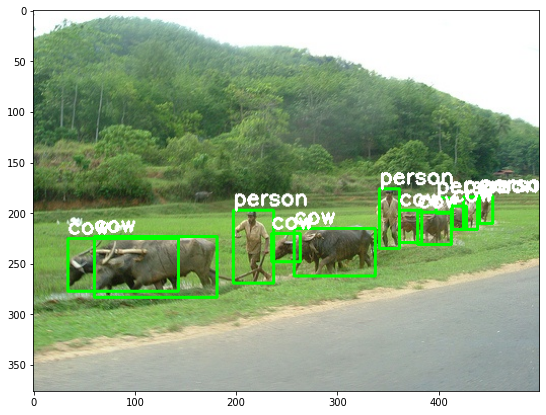

In [46]:
#Pickup a random image number
img_num = np.random.randint(0, df.shape[0])

#Read the image
img_file = df.loc[img_num,'filename']
img = cv2.imread(img_path + '/' + img_file)

#Find all rows which have same file name
rows_with_file = df[df['filename'] == img_file].index.tolist()

#Draw rectangle(s) as per bounding box information
for i in rows_with_file:

    #Get bounding box
    xmin, ymin, xmax, ymax = df.loc[i, ['xmin', 'ymin', 'xmax', 'ymax']]
    #Get Label
    label = df.loc[i, 'class']
    #Add bounding box
    cv2.rectangle(img, (xmin,ymin), (xmax, ymax), (0,255,0), 2)
    #Add text
    cv2.putText(img,label,(xmin, ymin-5),cv2.FONT_HERSHEY_SIMPLEX, 0.7, (255, 255, 255), 2)

#Convert BGR format (used by opencv to RGB format used by matplotlib)
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

#Draw image using matplotlib
plt.figure(figsize=(10,7))
plt.imshow(img)
plt.show()

Save training and test data as csv

In [47]:
train_df.to_csv('train.csv', index=False)
test_df.to_csv('test.csv', index=False)

In [48]:
#We should have training and test csv files in current directory
!ls -l

total 450544
-rw-r--r-- 1 root root    631843 May 30 14:27 detection_data.csv
-rw-r--r-- 1 root root    143854 May 30 14:34 test.csv
-rw-r--r-- 1 root root    528753 May 30 14:34 train.csv
drwxrwxrwx 3 root root      4096 Nov  6  2007 VOCdevkit
-rw-r--r-- 1 root root 460032000 Jul 18  2015 VOCtrainval_06-Nov-2007.tar
-rw------- 1 root root      2583 May 30 14:26 xml_to_csv.py


#### 4. Generate tfrecord from CSV
Tensorflow object detection API requires data in tfrecord format. This can be done using generate_tfrecord.py file.

In [49]:
#Copy generate_tfrecord.py from drive to current directory. 
#Change gdrive folder if you have saved script in some other folder
!cp '/gdrive/My Drive/Advanced Computer Vision AIML/Detection/generate_tfrecord.py' . 

In [50]:
#Make sure the script file is now available
!ls -l

total 450552
-rw-r--r-- 1 root root    631843 May 30 14:27 detection_data.csv
-rw------- 1 root root      4465 May 30 14:35 generate_tfrecord.py
-rw-r--r-- 1 root root    143854 May 30 14:34 test.csv
-rw-r--r-- 1 root root    528753 May 30 14:34 train.csv
drwxrwxrwx 3 root root      4096 Nov  6  2007 VOCdevkit
-rw-r--r-- 1 root root 460032000 Jul 18  2015 VOCtrainval_06-Nov-2007.tar
-rw------- 1 root root      2583 May 30 14:26 xml_to_csv.py


The script file requires 3 inputs

1. --csv_input=<csv_file_path> : where is csv file located which was prepared in previous step
2. --img_path=<images_folder> : where are the actual images stored
3. --output_path=<output_file_path> : where the script can save the generated tfrecord file and what should be file name.

We will run script for training and test csv separately to create two tfrecord files.

In [51]:
#generate tfrecord for training data
!python generate_tfrecord.py --csv_input=train.csv  --img_path={img_path} --output_path=train.tfrecord

2021-05-30 14:35:56.905300: I tensorflow/stream_executor/platform/default/dso_loader.cc:53] Successfully opened dynamic library libcudart.so.11.0
Successfully created the TFRecords: /content/detection/train.tfrecord


In [52]:
#generate tfrecord for test data
!python generate_tfrecord.py --csv_input=test.csv  --img_path={img_path} --output_path=test.tfrecord

2021-05-30 14:36:45.612448: I tensorflow/stream_executor/platform/default/dso_loader.cc:53] Successfully opened dynamic library libcudart.so.11.0
Successfully created the TFRecords: /content/detection/test.tfrecord


In [53]:
#train.record and test.record files should be available now
!ls -l

total 881844
-rw-r--r-- 1 root root    631843 May 30 14:27 detection_data.csv
-rw------- 1 root root      4465 May 30 14:35 generate_tfrecord.py
-rw-r--r-- 1 root root    143854 May 30 14:34 test.csv
-rw-r--r-- 1 root root  89066086 May 30 14:36 test.tfrecord
-rw-r--r-- 1 root root    528753 May 30 14:34 train.csv
-rw-r--r-- 1 root root 352572602 May 30 14:36 train.tfrecord
drwxrwxrwx 3 root root      4096 Nov  6  2007 VOCdevkit
-rw-r--r-- 1 root root 460032000 Jul 18  2015 VOCtrainval_06-Nov-2007.tar
-rw------- 1 root root      2583 May 30 14:26 xml_to_csv.py


#### 5. Create Label Mapping File

In [54]:
#Dict which was created earlier will be used for building Label Mapping file
label_class_dict

{1: 'aeroplane',
 2: 'bicycle',
 3: 'bird',
 4: 'boat',
 5: 'bottle',
 6: 'bus',
 7: 'car',
 8: 'cat',
 9: 'chair',
 10: 'cow',
 11: 'diningtable',
 12: 'dog',
 13: 'horse',
 14: 'motorbike',
 15: 'person',
 16: 'pottedplant',
 17: 'sheep',
 18: 'sofa',
 19: 'train',
 20: 'tvmonitor'}

In [55]:
#Build a pbtxt label file using label and class name
#This is required by Object detection API
#You can prepare it manually as well.

pbtxt_file_txt = ''
for label in sorted(label_class_dict.keys()):
    
    pbtxt_file_txt += "item {\n  id: " + str(label) + "\n  name: '" +  label_class_dict[label] + "'\n}\n\n"

with open('label_map.txt','w') as pbfile:
    pbfile.write(pbtxt_file_txt)

In [56]:
!ls -l

total 881848
-rw-r--r-- 1 root root    631843 May 30 14:27 detection_data.csv
-rw------- 1 root root      4465 May 30 14:35 generate_tfrecord.py
-rw-r--r-- 1 root root       706 May 30 14:37 label_map.txt
-rw-r--r-- 1 root root    143854 May 30 14:34 test.csv
-rw-r--r-- 1 root root  89066086 May 30 14:36 test.tfrecord
-rw-r--r-- 1 root root    528753 May 30 14:34 train.csv
-rw-r--r-- 1 root root 352572602 May 30 14:36 train.tfrecord
drwxrwxrwx 3 root root      4096 Nov  6  2007 VOCdevkit
-rw-r--r-- 1 root root 460032000 Jul 18  2015 VOCtrainval_06-Nov-2007.tar
-rw------- 1 root root      2583 May 30 14:26 xml_to_csv.py


In [57]:
#Review the file content
!cat label_map.txt

item {
  id: 1
  name: 'aeroplane'
}

item {
  id: 2
  name: 'bicycle'
}

item {
  id: 3
  name: 'bird'
}

item {
  id: 4
  name: 'boat'
}

item {
  id: 5
  name: 'bottle'
}

item {
  id: 6
  name: 'bus'
}

item {
  id: 7
  name: 'car'
}

item {
  id: 8
  name: 'cat'
}

item {
  id: 9
  name: 'chair'
}

item {
  id: 10
  name: 'cow'
}

item {
  id: 11
  name: 'diningtable'
}

item {
  id: 12
  name: 'dog'
}

item {
  id: 13
  name: 'horse'
}

item {
  id: 14
  name: 'motorbike'
}

item {
  id: 15
  name: 'person'
}

item {
  id: 16
  name: 'pottedplant'
}

item {
  id: 17
  name: 'sheep'
}

item {
  id: 18
  name: 'sofa'
}

item {
  id: 19
  name: 'train'
}

item {
  id: 20
  name: 'tvmonitor'
}



#### 6. Download a pre-trained model

A list of pre-trained models is available at [TensorFlow model zoo](https://github.com/tensorflow/models/blob/master/research/object_detection/g3doc/tf1_detection_zoo.md). We will use 'ssd_mobilenet_v1_coco' model for transfer learning.

In [58]:
#Download the model from zoo
!wget -q http://download.tensorflow.org/models/object_detection/tf2/20200711/ssd_mobilenet_v2_320x320_coco17_tpu-8.tar.gz

In [59]:
!ls -l

total 926812
-rw-r--r-- 1 root root    631843 May 30 14:27 detection_data.csv
-rw------- 1 root root      4465 May 30 14:35 generate_tfrecord.py
-rw-r--r-- 1 root root       706 May 30 14:37 label_map.txt
-rw-r--r-- 1 root root  46042990 Jul 11  2020 ssd_mobilenet_v2_320x320_coco17_tpu-8.tar.gz
-rw-r--r-- 1 root root    143854 May 30 14:34 test.csv
-rw-r--r-- 1 root root  89066086 May 30 14:36 test.tfrecord
-rw-r--r-- 1 root root    528753 May 30 14:34 train.csv
-rw-r--r-- 1 root root 352572602 May 30 14:36 train.tfrecord
drwxrwxrwx 3 root root      4096 Nov  6  2007 VOCdevkit
-rw-r--r-- 1 root root 460032000 Jul 18  2015 VOCtrainval_06-Nov-2007.tar
-rw------- 1 root root      2583 May 30 14:26 xml_to_csv.py


In [60]:
#Extract tar file content
!tar -xf ssd_mobilenet_v2_320x320_coco17_tpu-8.tar.gz

In [61]:
!ls -l

total 926816
-rw-r--r-- 1 root   root     631843 May 30 14:27 detection_data.csv
-rw------- 1 root   root       4465 May 30 14:35 generate_tfrecord.py
-rw-r--r-- 1 root   root        706 May 30 14:37 label_map.txt
drwxr-x--- 4 345018 89939      4096 Jul 11  2020 ssd_mobilenet_v2_320x320_coco17_tpu-8
-rw-r--r-- 1 root   root   46042990 Jul 11  2020 ssd_mobilenet_v2_320x320_coco17_tpu-8.tar.gz
-rw-r--r-- 1 root   root     143854 May 30 14:34 test.csv
-rw-r--r-- 1 root   root   89066086 May 30 14:36 test.tfrecord
-rw-r--r-- 1 root   root     528753 May 30 14:34 train.csv
-rw-r--r-- 1 root   root  352572602 May 30 14:36 train.tfrecord
drwxrwxrwx 3 root   root       4096 Nov  6  2007 VOCdevkit
-rw-r--r-- 1 root   root  460032000 Jul 18  2015 VOCtrainval_06-Nov-2007.tar
-rw------- 1 root   root       2583 May 30 14:26 xml_to_csv.py


In [62]:
#Check the extracted folder
!ls -l ssd_mobilenet_v2_320x320_coco17_tpu-8

total 16
drwxr-x--- 2 345018 89939 4096 Jul 10  2020 checkpoint
-rw-r----- 1 345018 89939 4496 Jul 11  2020 pipeline.config
drwxr-x--- 3 345018 89939 4096 Jul 10  2020 saved_model


In [63]:
#Check the extracted folder
!ls -l ssd_mobilenet_v2_320x320_coco17_tpu-8/checkpoint

total 23924
-rw-r----- 1 345018 89939      166 Jul 10  2020 checkpoint
-rw-r----- 1 345018 89939 24484350 Jul 10  2020 ckpt-0.data-00000-of-00001
-rw-r----- 1 345018 89939     6121 Jul 10  2020 ckpt-0.index


#### 7. Prepare Training configuration file

1. Change num_classes parameter to 20 (as we have 20 categories in pascal voc dataset)
2. For 'train_input_reader' change 'input_path' to filepath of train.record file.
3. For 'train_input_reader' change 'label_map_path' to filepath of pascal_voc.pbtxt file.
4. Repeat above two steps for 'eval_input_reader'.
5. Change fine_tune_checkpoint to filepath where pre-trained model.ckpt file is available e.g ssd_mobilenet_v1_coco_2018_01_28/model.ckpt
6. Change 'batch_size' accordingly to available memory.
7. Change 'num_steps' to indicate how long the training will done e.g. 200000. For demo purpose, we are keeping it to 20 so that we can finish training quickly.


You can copy a sample configuration for the chosen pre-trained model (SSD MobileNet v2 320x320) in this case from [Configs](https://github.com/tensorflow/models/tree/master/research/object_detection/configs/tf2) folder. Here are things which need to be changed at a minimum.

In [64]:
#Copy ssd_mobilenet_v2_modified.config from drive to current directory. 
#Change gdrive folder if you have saved script in some other folder
!cp '/gdrive/My Drive/Advanced Computer Vision AIML/Detection/ssd_mobilenet_v2_modified.config' . 

In [65]:
!cat  ssd_mobilenet_v2_modified.config

# SSD with Mobilenet v2
# Trained on COCO17, initialized from Imagenet classification checkpoint
# Train on TPU-8
#
# Achieves 22.2 mAP on COCO17 Val

model {
  ssd {
    inplace_batchnorm_update: true
    freeze_batchnorm: false
    num_classes: 20
    box_coder {
      faster_rcnn_box_coder {
        y_scale: 10.0
        x_scale: 10.0
        height_scale: 5.0
        width_scale: 5.0
      }
    }
    matcher {
      argmax_matcher {
        matched_threshold: 0.5
        unmatched_threshold: 0.5
        ignore_thresholds: false
        negatives_lower_than_unmatched: true
        force_match_for_each_row: true
        use_matmul_gather: true
      }
    }
    similarity_calculator {
      iou_similarity {
      }
    }
    encode_background_as_zeros: true
    anchor_generator {
      ssd_anchor_generator {
        num_layers: 6
        min_scale: 0.2
        max_scale: 0.95
        aspect_ratios: 1.0
        aspect_ratios: 2.0
        aspect_ratios: 0.5
        aspect_ratios: 3.0


Set Config file name

In [66]:
config_file = 'ssd_mobilenet_v2_modified.config'

#### 8. Training the model

In [67]:
#Copy training file from 'models/research/object_detection' folder to current folder
!cp /content/models/research/object_detection/model_main_tf2.py .

In [68]:
!ls -l

total 926832
-rw-r--r-- 1 root   root     631843 May 30 14:27 detection_data.csv
-rw------- 1 root   root       4465 May 30 14:35 generate_tfrecord.py
-rw-r--r-- 1 root   root        706 May 30 14:37 label_map.txt
-rw-r--r-- 1 root   root       4776 May 30 15:00 model_main_tf2.py
drwxr-x--- 4 345018 89939      4096 May 30 14:59 ssd_mobilenet_v2_320x320_coco17_tpu-8
-rw-r--r-- 1 root   root   46042990 Jul 11  2020 ssd_mobilenet_v2_320x320_coco17_tpu-8.tar.gz
-rw------- 1 root   root       4362 May 30 15:00 ssd_mobilenet_v2_modified.config
-rw-r--r-- 1 root   root     143854 May 30 14:34 test.csv
-rw-r--r-- 1 root   root   89066086 May 30 14:36 test.tfrecord
-rw-r--r-- 1 root   root     528753 May 30 14:34 train.csv
-rw-r--r-- 1 root   root  352572602 May 30 14:36 train.tfrecord
drwxrwxrwx 3 root   root       4096 Nov  6  2007 VOCdevkit
-rw-r--r-- 1 root   root  460032000 Jul 18  2015 VOCtrainval_06-Nov-2007.tar
-rw------- 1 root   root       2583 May 30 14:26 xml_to_csv.py


Start training 

- Please note that Object detection take long time to train. The training may take few days if run on single GPU machine (depending on num of steps indicated). Try to keep training the model till loss comes close to 1 (or goes below 1). The script takes 3 inputs

1. --train_dir=<folder_name> : where model will be saved periodically as training progresses
2. --pipeline_config_path=<config_file_path> :where is model training configuration file located.

In [69]:
#Create a training folder to store model checkpoints/snapshots as training progresses
!mkdir training

In [70]:
#Check training folder
!ls -l training

total 0


Start Tensorboard

In [71]:
%load_ext tensorboard

In [72]:
%tensorboard --logdir training

Output hidden; open in https://colab.research.google.com to view.

In [73]:
#start training
!python model_main_tf2.py --model_dir=training/ --pipeline_config_path={config_file} --checkpoint_every_n=100 --alsologtostderr

2021-05-30 15:01:50.770464: I tensorflow/stream_executor/platform/default/dso_loader.cc:53] Successfully opened dynamic library libcudart.so.11.0
2021-05-30 15:01:52.812698: I tensorflow/stream_executor/platform/default/dso_loader.cc:53] Successfully opened dynamic library libcuda.so.1
2021-05-30 15:01:52.882444: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2021-05-30 15:01:52.883083: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1733] Found device 0 with properties: 
pciBusID: 0000:00:04.0 name: Tesla T4 computeCapability: 7.5
coreClock: 1.59GHz coreCount: 40 deviceMemorySize: 14.75GiB deviceMemoryBandwidth: 298.08GiB/s
2021-05-30 15:01:52.883168: I tensorflow/stream_executor/platform/default/dso_loader.cc:53] Successfully opened dynamic library libcudart.so.11.0
2021-05-30 15:01:52.965115: I tensorflow/stream_executor/platform/default

Model Evaluation

In [74]:
#start Evaluation - THIS WILL KEEP RUNNING.
!python model_main_tf2.py --model_dir=training/ --pipeline_config_path={config_file} --checkpoint_dir=training/ --alsologtostderr 

2021-05-30 15:06:56.677399: I tensorflow/stream_executor/platform/default/dso_loader.cc:53] Successfully opened dynamic library libcudart.so.11.0
W0530 15:06:58.693449 140073961727872 model_lib_v2.py:1064] Forced number of epochs for all eval validations to be 1.
INFO:tensorflow:Maybe overwriting sample_1_of_n_eval_examples: None
I0530 15:06:58.693731 140073961727872 config_util.py:552] Maybe overwriting sample_1_of_n_eval_examples: None
INFO:tensorflow:Maybe overwriting use_bfloat16: False
I0530 15:06:58.693857 140073961727872 config_util.py:552] Maybe overwriting use_bfloat16: False
INFO:tensorflow:Maybe overwriting eval_num_epochs: 1
I0530 15:06:58.693967 140073961727872 config_util.py:552] Maybe overwriting eval_num_epochs: 1
W0530 15:06:58.694090 140073961727872 model_lib_v2.py:1085] Expected number of evaluation epochs is 1, but instead encountered `eval_on_train_input_config.num_epochs` = 0. Overwriting `num_epochs` to 1.
2021-05-30 15:06:58.704216: I tensorflow/stream_executor/

#### Training and Evaluation in Background

If we want to evaluate our model on training data regularly, we have to run both training and evaluation script in parallel. Model evaluation on test data gets done everytime model checkpoint is saved during training.

In [ ]:
#Start training
!nohup /usr/bin/python3 model_main_tf2.py --model_dir=training/ --pipeline_config_path={config_file} --checkpoint_every_n=500 --alsologtostderr --eval_training_data --sample_1_of_n_eval_on_train_examples=10  > train.txt 2>&1 &

In [ ]:
!nohup /usr/bin/python3 model_main_tf2.py --model_dir=training/ --pipeline_config_path={config_file} --checkpoint_dir=training/ --alsologtostderr > eval.txt 2>&1 &

In [ ]:
!cat train.txt

In [ ]:
!cat eval.txt

In [ ]:
#Check the training folder
!ls -l training

total 213144
-rw-r--r-- 1 root root      610 May 30 07:43 checkpoint
-rw-r--r-- 1 root root 19892099 May 30 07:40 ckpt-1.data-00000-of-00001
-rw-r--r-- 1 root root    22273 May 30 07:40 ckpt-1.index
-rw-r--r-- 1 root root 39616583 May 30 07:41 ckpt-2.data-00000-of-00001
-rw-r--r-- 1 root root    41660 May 30 07:41 ckpt-2.index
-rw-r--r-- 1 root root 39616583 May 30 07:42 ckpt-3.data-00000-of-00001
-rw-r--r-- 1 root root    41660 May 30 07:42 ckpt-3.index
-rw-r--r-- 1 root root 39616583 May 30 07:42 ckpt-4.data-00000-of-00001
-rw-r--r-- 1 root root    41660 May 30 07:42 ckpt-4.index
-rw-r--r-- 1 root root 39616583 May 30 07:43 ckpt-5.data-00000-of-00001
-rw-r--r-- 1 root root    41660 May 30 07:43 ckpt-5.index
-rw-r--r-- 1 root root 39616583 May 30 07:43 ckpt-6.data-00000-of-00001
-rw-r--r-- 1 root root    41660 May 30 07:43 ckpt-6.index
drwxr-xr-x 2 root root     4096 May 30 07:44 eval
drwxr-xr-x 2 root root     4096 May 30 07:39 train


#### 9. Export trained model

From the saved model checkpoints, we will create a frozen trained model. Frozen here means to remove model nodes which are no longer needed in prediction. This reduces model size.

In [75]:
#Copy export_inference_graph.py file from models/research/object_detection to current directory
!cp /content/models/research/object_detection/exporter_main_v2.py .

In [76]:
!ls -l

total 926844
-rw-r--r-- 1 root   root     631843 May 30 14:27 detection_data.csv
-rw-r--r-- 1 root   root       7605 May 30 15:13 exporter_main_v2.py
-rw------- 1 root   root       4465 May 30 14:35 generate_tfrecord.py
-rw-r--r-- 1 root   root        706 May 30 14:37 label_map.txt
-rw-r--r-- 1 root   root       4776 May 30 15:00 model_main_tf2.py
drwxr-x--- 4 345018 89939      4096 May 30 15:13 ssd_mobilenet_v2_320x320_coco17_tpu-8
-rw-r--r-- 1 root   root   46042990 Jul 11  2020 ssd_mobilenet_v2_320x320_coco17_tpu-8.tar.gz
-rw------- 1 root   root       4362 May 30 15:00 ssd_mobilenet_v2_modified.config
-rw-r--r-- 1 root   root     143854 May 30 14:34 test.csv
-rw-r--r-- 1 root   root   89066086 May 30 14:36 test.tfrecord
-rw-r--r-- 1 root   root     528753 May 30 14:34 train.csv
drwxr-xr-x 4 root   root       4096 May 30 15:07 training
-rw-r--r-- 1 root   root  352572602 May 30 14:36 train.tfrecord
drwxrwxrwx 3 root   root       4096 Nov  6  2007 VOCdevkit
-rw-r--r-- 1 root   root  

The export_inference_graph.py script file requires the following input:

1. --input_type <input_node_name> : This will be used during prediction to set model input
2. --pipeline_config_path <model_training_config_file_path> : where is model training config file located.
3. --trained_checkpoint_prefix <file_path__model_checkpoint> : Which checkpoint should be used to create final model.
4. --output_directory <frozen_model_directory> : where should the frozen model created by script should be stored.

In [77]:
#Provide input name, config file location, training folder
!python exporter_main_v2.py --input_type "image_tensor" --pipeline_config_path {config_file} --trained_checkpoint_dir training/ --output_directory detection_model

2021-05-30 15:13:47.337846: I tensorflow/stream_executor/platform/default/dso_loader.cc:53] Successfully opened dynamic library libcudart.so.11.0
2021-05-30 15:13:49.097720: I tensorflow/stream_executor/platform/default/dso_loader.cc:53] Successfully opened dynamic library libcuda.so.1
2021-05-30 15:13:49.127702: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2021-05-30 15:13:49.128277: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1733] Found device 0 with properties: 
pciBusID: 0000:00:04.0 name: Tesla T4 computeCapability: 7.5
coreClock: 1.59GHz coreCount: 40 deviceMemorySize: 14.75GiB deviceMemoryBandwidth: 298.08GiB/s
2021-05-30 15:13:49.128329: I tensorflow/stream_executor/platform/default/dso_loader.cc:53] Successfully opened dynamic library libcudart.so.11.0
2021-05-30 15:13:49.130924: I tensorflow/stream_executor/platform/default

In [78]:
#Check if model is saved in current directory
!ls -l detection_model

total 16
drwxr-xr-x 2 root root 4096 May 30 15:14 checkpoint
-rw-r--r-- 1 root root 4188 May 30 15:14 pipeline.config
drwxr-xr-x 4 root root 4096 May 30 15:14 saved_model


In [79]:
#Check if model is saved in current directory
!ls -l detection_model/saved_model

total 10772
drwxr-xr-x 2 root root     4096 May 30 15:14 assets
-rw-r--r-- 1 root root 11019386 May 30 15:14 saved_model.pb
drwxr-xr-x 2 root root     4096 May 30 15:14 variables


In [80]:
!ls -l detection_model/saved_model/variables/

total 19520
-rw-r--r-- 1 root root 19967859 May 30 15:14 variables.data-00000-of-00001
-rw-r--r-- 1 root root    18893 May 30 15:14 variables.index


In [81]:
!ls -l detection_model/saved_model/assets

total 0


#### Move the trained model to Google Drive

In [82]:
!cp -r detection_model '/gdrive/My Drive/Advanced Computer Vision AIML/Detection/models/pascal_voc_tf2/' 

Save label dictionary as well for model prediction

In [83]:
print(label_class_dict)

{7: 'car', 8: 'cat', 15: 'person', 9: 'chair', 4: 'boat', 16: 'pottedplant', 13: 'horse', 12: 'dog', 2: 'bicycle', 14: 'motorbike', 10: 'cow', 19: 'train', 11: 'diningtable', 18: 'sofa', 20: 'tvmonitor', 5: 'bottle', 3: 'bird', 1: 'aeroplane', 6: 'bus', 17: 'sheep'}


In [84]:
import pickle

label_file_path = '/gdrive/My Drive/Advanced Computer Vision AIML/Detection/models/pascal_voc_tf2/pascal_voc_label.pkl'

with open(label_file_path,'wb') as file:
    pickle.dump(label_class_dict, file)

#### Model Prediction

In [85]:
import tensorflow as tf

Load Saved model

In [86]:
saved_model_path = 'detection_model/saved_model'
model = tf.saved_model.load(saved_model_path)

Function to get model prediction

In [87]:
#Function to get predictions from a Detection model
def detector_prediction(image_file, confidence_threshold=0.5):

    """
    image_file: File path of the image for which prediction needs to be done
    confidence_threshold: Minimum confidence/probability for prediction to be considered
    """
    #Load image
    img = tf.keras.preprocessing.image.load_img(image_file)
    
    #Convert to numpy array
    img_array = tf.keras.preprocessing.image.img_to_array(img).astype('uint8')
    #Make it a batch of one example
    img_array = tf.expand_dims(img_array, axis=0)

    #Prediction
    output = model(img_array) #get list of tensors discussed above as output
    #print(output)
    detection_scores = output['detection_scores'].numpy()[0] #get detection scores
    detection_classes = output['detection_classes'].numpy()[0]
    detection_boxes = output['detection_boxes'].numpy()[0]

    #Select predictions for which probability is higher than confidence_threshold
    selected_predictions = detection_scores >= confidence_threshold

    selected_prediction_scores = detection_scores[selected_predictions]
    selected_prediction_classes = detection_classes[selected_predictions]
    selected_prediction_boxes = detection_boxes[selected_predictions]

    #De-normalize box co-ordinates (multiply x-coordinates by image width and y-coords by image height)
    img_w, img_h = img.size

    for i in range(selected_prediction_boxes.shape[0]):
        
        selected_prediction_boxes[i,0] *= img_h #ymin * img_w
        selected_prediction_boxes[i,1] *= img_w #xmin * img_h
        selected_prediction_boxes[i,2] *= img_h #ymax * img_w
        selected_prediction_boxes[i,3] *= img_w #xmax * img_h

    #Make all co-ordinates as integer
    selected_prediction_boxes= selected_prediction_boxes.astype(int)

    #Convert class indexes to actual class labels
    predicted_classes = []
    for i in range(selected_prediction_classes.shape[0]):
        predicted_classes.append(label_class_dict[int(selected_prediction_classes[i])])

    #Number of predictions
    selected_num_predictions = selected_prediction_boxes.shape[0]

    return {'Total Predictions': selected_num_predictions,
            'Scores': selected_prediction_scores, 
            'Classes': predicted_classes, 
            'Box coordinates': selected_prediction_boxes}

Copy an image to predict on

In [88]:
!cp '/gdrive/My Drive/Advanced Computer Vision AIML/Detection/Group Photo.jpeg' .

In [89]:
!ls -l

total 926888
-rw-r--r-- 1 root   root     631843 May 30 14:27  detection_data.csv
drwxr-xr-x 4 root   root       4096 May 30 15:14  detection_model
-rw-r--r-- 1 root   root       7605 May 30 15:13  exporter_main_v2.py
-rw------- 1 root   root       4465 May 30 14:35  generate_tfrecord.py
-rw------- 1 root   root      39192 May 30 15:15 'Group Photo.jpeg'
-rw-r--r-- 1 root   root        706 May 30 14:37  label_map.txt
-rw-r--r-- 1 root   root       4776 May 30 15:00  model_main_tf2.py
drwxr-x--- 4 345018 89939      4096 May 30 15:13  ssd_mobilenet_v2_320x320_coco17_tpu-8
-rw-r--r-- 1 root   root   46042990 Jul 11  2020  ssd_mobilenet_v2_320x320_coco17_tpu-8.tar.gz
-rw------- 1 root   root       4362 May 30 15:00  ssd_mobilenet_v2_modified.config
-rw-r--r-- 1 root   root     143854 May 30 14:34  test.csv
-rw-r--r-- 1 root   root   89066086 May 30 14:36  test.tfrecord
-rw-r--r-- 1 root   root     528753 May 30 14:34  train.csv
drwxr-xr-x 4 root   root       4096 May 30 15:07  training
-rw

In [90]:
#Model output
detector_prediction('Group Photo.jpeg', confidence_threshold=0.6)

{'Box coordinates': array([[ 82, 371, 255, 464],
        [113, 152, 290, 232],
        [115, 271, 293, 356],
        [ 29,  56, 298, 149],
        [ 91, 237, 296, 306]]),
 'Classes': ['person', 'person', 'person', 'person', 'person'],
 'Scores': array([0.83919394, 0.7331972 , 0.72731584, 0.6788405 , 0.65888536],
       dtype=float32),
 'Total Predictions': 5}

Visualize model output

In [91]:
import cv2
from matplotlib import pyplot as plt

In [92]:
def visualize_output(image_file, confidence_threshold=0.5):

    #Call model prediction function above
    output = detector_prediction(image_file, confidence_threshold=confidence_threshold)

    #Read image
    img = cv2.imread(image_file)

    #Draw rectangle for predicted boxes, also add predicted classes
    for i in range(output['Box coordinates'].shape[0]):

        box = output['Box coordinates'][i]
        
        #Draw rectangle - (ymin, xmin, ymax, xmax)
        img = cv2.rectangle(img, (box[1], box[0]), (box[3], box[2]), (0,255,0), 2)
        
        #Add Label - Class name and confidence level
        label = output['Classes'][i] + ': ' + str(round(output['Scores'][i],2))
        img = cv2.putText(img, label, (box[1], box[0]-10), cv2.FONT_HERSHEY_SIMPLEX, 1, (255,255,255), 2, cv2.LINE_AA)
    
    #Conver BGR image to RGB to use with Matplotlib
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    #Display image
    plt.figure(figsize=(10,6))
    plt.imshow(img)
    plt.show()

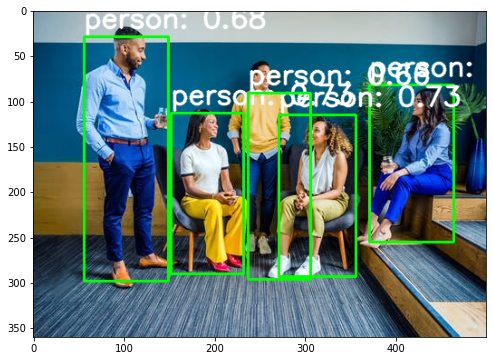

In [99]:
#Visualize on image
visualize_output('Group Photo.jpeg', confidence_threshold=0.6)

Let's download couple of images for which we will do predictions.

In [100]:
!wget -O 'image1.jpg' https://github.com/tensorflow/models/raw/master/research/object_detection/test_images/image2.jpg

--2021-05-30 15:17:18--  https://github.com/tensorflow/models/raw/master/research/object_detection/test_images/image2.jpg
Resolving github.com (github.com)... 140.82.114.3
Connecting to github.com (github.com)|140.82.114.3|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://raw.githubusercontent.com/tensorflow/models/master/research/object_detection/test_images/image2.jpg [following]
--2021-05-30 15:17:18--  https://raw.githubusercontent.com/tensorflow/models/master/research/object_detection/test_images/image2.jpg
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 1415684 (1.3M) [image/jpeg]
Saving to: ‘image1.jpg’

image1.jpg          100%[===================>]   1.35M  --.-KB/s    in 0.03s   

2021-05-30 15:17:18 (42.6 MB/s)

In [101]:
!ls -l

total 928272
-rw-r--r-- 1 root   root     631843 May 30 14:27  detection_data.csv
drwxr-xr-x 4 root   root       4096 May 30 15:14  detection_model
-rw-r--r-- 1 root   root       7605 May 30 15:13  exporter_main_v2.py
-rw------- 1 root   root       4465 May 30 14:35  generate_tfrecord.py
-rw------- 1 root   root      39192 May 30 15:15 'Group Photo.jpeg'
-rw-r--r-- 1 root   root    1415684 May 30 15:17  image1.jpg
-rw-r--r-- 1 root   root        706 May 30 14:37  label_map.txt
-rw-r--r-- 1 root   root       4776 May 30 15:00  model_main_tf2.py
drwxr-x--- 4 345018 89939      4096 May 30 15:13  ssd_mobilenet_v2_320x320_coco17_tpu-8
-rw-r--r-- 1 root   root   46042990 Jul 11  2020  ssd_mobilenet_v2_320x320_coco17_tpu-8.tar.gz
-rw------- 1 root   root       4362 May 30 15:00  ssd_mobilenet_v2_modified.config
-rw-r--r-- 1 root   root     143854 May 30 14:34  test.csv
-rw-r--r-- 1 root   root   89066086 May 30 14:36  test.tfrecord
-rw-r--r-- 1 root   root     528753 May 30 14:34  train.csv
d

In [102]:
#Model predictions for image1.jpg
detector_prediction('image1.jpg', confidence_threshold=0.3)

{'Box coordinates': array([[ 671,  217,  833,  277],
        [ 668,  207,  890,  303],
        [ 511,   90,  580,  134],
        [ 513,   31,  576,   67],
        [ 384, 1080,  432, 1126],
        [ 620,  140,  765,  202],
        [ 593,   91,  710,  138],
        [ 607,  119,  869,  239],
        [ 624,   90,  756,  140],
        [ 597,  144,  706,  202],
        [ 236,  292,  294,  342]]),
 'Classes': ['person',
  'person',
  'person',
  'person',
  'person',
  'person',
  'person',
  'person',
  'person',
  'person',
  'bird'],
 'Scores': array([0.5814951 , 0.5478422 , 0.4449276 , 0.43013483, 0.41801676,
        0.413243  , 0.3719483 , 0.35905346, 0.3431794 , 0.3199557 ,
        0.31040788], dtype=float32),
 'Total Predictions': 11}

#### Visualizing Model Prediction

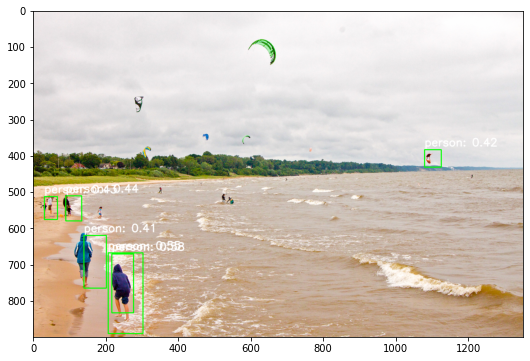

In [106]:
#Visualize first image
visualize_output('image1.jpg',confidence_threshold=0.4)

In [114]:
#Predict on random images in test dataset
import numpy as np
image_num = np.random.randint(0, df.shape[0])
image_file = 'VOCdevkit/VOC2007/JPEGImages/' + df.loc[image_num, 'filename']
detector_prediction(image_file, confidence_threshold=0.6)

{'Box coordinates': array([[178, 101, 500, 243],
        [141,   5, 491, 127],
        [194, 248, 500, 363],
        [185, 330, 500, 482],
        [197, 163, 497, 325],
        [198, 260, 494, 442]]),
 'Classes': ['person', 'person', 'person', 'person', 'person', 'person'],
 'Scores': array([0.7728335 , 0.73480976, 0.7008481 , 0.68075866, 0.6421013 ,
        0.61545277], dtype=float32),
 'Total Predictions': 6}

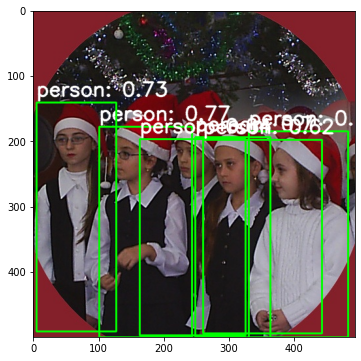

In [115]:
#Visualize first image
visualize_output(image_file,confidence_threshold=0.6)

In [117]:
#Model predictions for image1.jpg
detector_prediction('Airplane.jpg', confidence_threshold=0.5)

{'Box coordinates': array([[  69, 1227,  161, 1596],
        [1009, 1862, 1213, 2436],
        [ 123,  374,  960, 1781],
        [1112,  115, 1424, 1300],
        [1172, 2152, 1440, 2560],
        [1036, 1983, 1274, 2456],
        [1222,  181, 1439, 1087]]),
 'Classes': ['car', 'car', 'boat', 'aeroplane', 'car', 'car', 'car'],
 'Scores': array([0.6396558 , 0.61441696, 0.5858484 , 0.5656241 , 0.5452364 ,
        0.5293301 , 0.52404857], dtype=float32),
 'Total Predictions': 7}

#### Visualizing Model Prediction

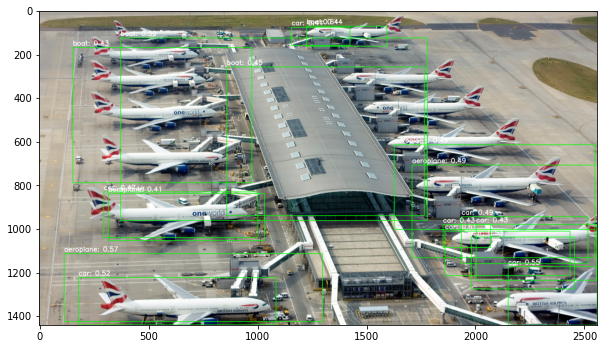

In [119]:
#Visualize first image
visualize_output('Airplane.jpg',confidence_threshold=0.4)